# EM sovereign debt and macro risk premium scores

## Get packages and JPMaQS data

In [ ]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import os
import io

from datetime import datetime

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv

from macrosynergy.download import JPMaQSDownload
from macrosynergy.visuals import ScoreVisualisers
from macrosynergy.panel.adjust_weights import adjust_weights
import warnings

pd.set_option('display.width', 400)

warnings.simplefilter("ignore")

In [2]:
cids_fc_latam = [  # Latam foreign currency debt countries
    "BRL",
    "CLP",
    "COP",
    "DOP",
    "MXN",
    "PEN",
    "UYU",
]
cids_fc_emeu = [  # EM Europe foreign currency debt countries
    "HUF",
    "PLN",
    "RON",
    "RUB",
    "RSD",
    "TRY",
]
cids_fc_meaf = [  # Middle-East and Africa foreign currency debt countries
    "AED",
    "EGP",
    "NGN",
    "OMR",
    "QAR",
    "ZAR",
    "SAR", 
]
cids_fc_asia = [  # Asia foreign currency debt countries
    "CNY",
    "IDR",
    "INR",
    "PHP",
]

cids_fc = sorted(list(set(cids_fc_latam + cids_fc_emeu + cids_fc_meaf + cids_fc_asia)))
cids_emxfc = ['CZK', 'ILS', 'KRW', 'MYR', 'SGD', 'THB', 'TWD']

cids_em = sorted(cids_fc + cids_emxfc)

In [3]:
# Category tickers

# Features
govfin = [
    "GGOBGDPRATIO_NSA",
    "GGOBGDPRATIONY_NSA",
    "GGDGDPRATIO_NSA",
]

xbal = [
    "CABGDPRATIO_NSA_12MMA",
    "MTBGDPRATIO_NSA_12MMA",
]

xliab = [
    "NIIPGDP_NSA_D1Mv2YMA",
    "NIIPGDP_NSA_D1Mv5YMA",
    "IIPLIABGDP_NSA_D1Mv2YMA",
    "IIPLIABGDP_NSA_D1Mv5YMA",
]

xdebt = [
    "ALLIFCDSGDP_NSA",
    "GGIFCDSGDP_NSA",
]


risk_metrics = [
    "LTFCRATING_NSA",
    "LTLCRATING_NSA",
    "FCBICRY_NSA",
    "FCBICRY_VT10",
    "CDS05YSPRD_NSA",
    "CDS05YXRxEASD_NSA",
]

# Targets

rets = ["FCBIR_NSA", "FCBIXR_NSA", "FCBIXR_VT10"]
bms = ["USD_EQXR_NSA", "UHY_CRXR_NSA", "UIG_CRXR_NSA"]


# Create ticker list

xcats = govfin + xbal + xliab + xdebt + risk_metrics + rets
tickers = [cid + "_" + xcat for cid in cids_em for xcat in xcats] + bms

print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 623


In [4]:
# Download series from J.P. Morgan DataQuery by tickers

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

start_date = "1998-01-01"
end_date = (pd.Timestamp.today() - pd.offsets.BDay(1)).strftime('%Y-%m-%d')

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date=start_date,
        end_date=end_date,
        suppress_warning=True,
        metrics=[
            "value",
        ],
        show_progress=True,
    )

dfx = df.copy()
dfx.info()

Timestamp UTC:  2025-03-28 15:59:19
Connection successful!


Requesting data: 100%|██████████████████████████| 32/32 [00:06<00:00,  4.85it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
81 out of 623 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3233494 entries, 0 to 3233493
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 98.7+ MB


## Availability checks and blacklisting

### Availability

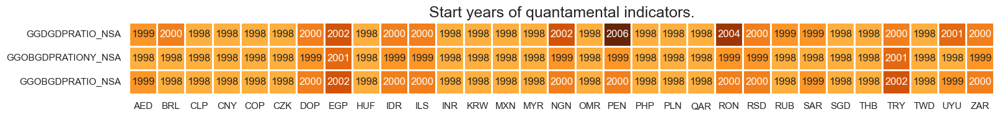

In [5]:
xcatx = govfin
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

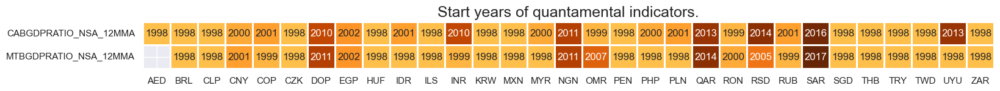

In [6]:
xcatx = xbal
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

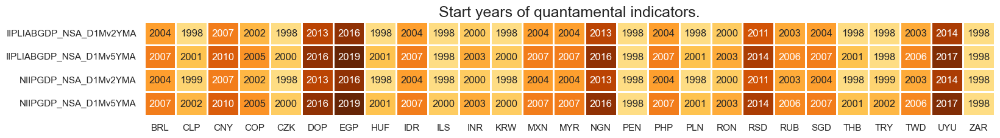

In [7]:
xcatx = xliab
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

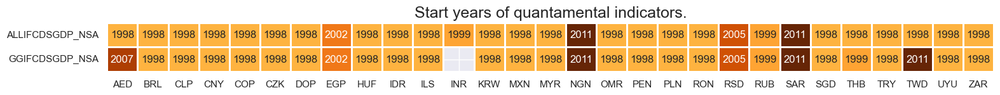

In [8]:
xcatx = xdebt
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

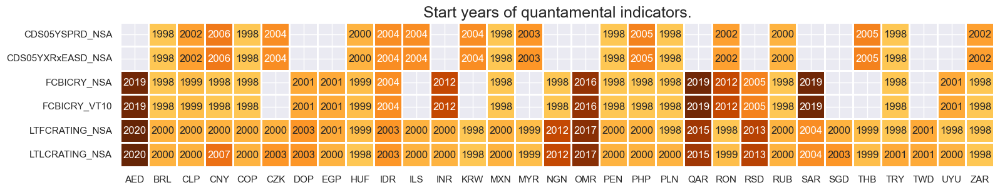

In [9]:
xcatx = risk_metrics
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

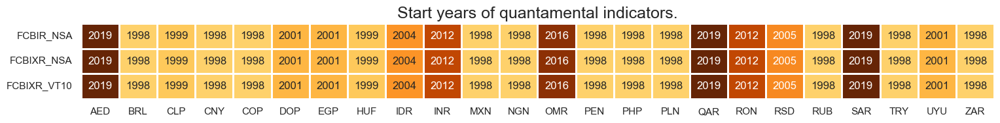

In [10]:
xcatx = rets
msm.check_availability(df=dfx, xcats=xcatx, cids=cids_em, missing_recent=False)

### Blacklist

In [11]:
black_fc = {'RUB': [Timestamp('2022-02-01 00:00:00'), Timestamp('2035-02-26 00:00:00')]}

## Factor construction and checks

### Macro risk score

In [12]:
# Governing dictionary

dict_macros = {
    "GOVFIN":{
        "GGOBGDPRATIO_NSA": ["median", ""],
        "GGOBGDPRATIONY_NSA": ["median", ""],
        "GGDGDPRATIO_NSA": ["median", "NEG"],
    },
    "XBAL":{
        "CABGDPRATIO_NSA_12MMA": ["zero", ""],
        "MTBGDPRATIO_NSA_12MMA": ["zero", ""],
    },
    "XLIAB":{
        "NIIPGDP_NSA_D1Mv2YMA": ["zero", ""],
        "NIIPGDP_NSA_D1Mv5YMA": ["zero", ""],
        "IIPLIABGDP_NSA_D1Mv2YMA": ["zero", "NEG"],
        "IIPLIABGDP_NSA_D1Mv5YMA": ["zero", "NEG"],
    },
    "XDEBT":{
        "ALLIFCDSGDP_NSA": ["median", "NEG"],
        "GGIFCDSGDP_NSA": ["median", "NEG"],
    },
}

In [13]:
dict_factz = {}
dict_labels = {}

In [14]:
# Normalize all macro-quantamental categories based on the broad EM set

cidx = cids_em

for fact in dict_macros.keys():
    
    dict_fact = dict_macros[fact]
    xcatx = list(dict_fact.keys())

    dfa = pd.DataFrame(columns=list(dfx.columns))

    for xc in xcatx:

        postfix = dict_fact[xc][1]
        neutral = dict_fact[xc][0]

        dfaa = msp.make_zn_scores(
            dfx,
            xcat=xc,
            cids=cidx,
            sequential=True,
            min_obs=261 * 3,
            neutral=neutral,
            pan_weight=1,
            thresh=3,
            postfix="_" + postfix + "ZN",
            est_freq="m",
        )
        dfaa["value"] = dfaa["value"] * (1 if postfix == "" else -1)
        dfa = msm.update_df(dfa, dfaa)

    dict_factz[fact] = dfa["xcat"].unique()
    dfx = msm.update_df(dfx, dfa)

In [15]:
# Combine quantamental scores to conceptual scores

cidx = cids_em

for key, value in dict_factz.items():

    dfa = msp.linear_composite(
        dfx,
        xcats=value,
        cids=cidx,
        complete_xcats=False,
        new_xcat=key,
    )

    dfx = msm.update_df(dfx, dfa)

for key in dict_factz.keys():

    dfa = msp.make_zn_scores(
        dfx,
        xcat=key,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    
    dfx = msm.update_df(dfx, dfa)

macroz = [fact + "_ZN" for fact in dict_factz.keys()]

In [16]:
dict_labels["GGOBGDPRATIO_NSA_ZN"] = "Excess general government balance, % of GDP, current year"
dict_labels["GGOBGDPRATIONY_NSA_ZN"] = "Excess government balance, % of GDP, next year"
dict_labels["GGDGDPRATIO_NSA_NEGZN"] = "Excess general government debt ratio, % of GDP, negative"

dict_labels["GOVFIN_ZN"] = "Government finances score"

dict_labels["CABGDPRATIO_NSA_12MMA_ZN"] = "Current account balance, 12mma, % of GDP"
dict_labels["MTBGDPRATIO_NSA_12MMA_ZN"] = "Merchandise trade balance, 12mma, % of GDP"

dict_labels["XBAL_ZN"] = "External balances score"

dict_labels["IIPLIABGDP_NSA_D1Mv2YMA_NEGZN"] = "International liabilities, latest versus 2yma, % of GDP, negative"
dict_labels["IIPLIABGDP_NSA_D1Mv5YMA_NEGZN"] = "International liabilities, latest versus 5yma, % of GDP, negative"
dict_labels["NIIPGDP_NSA_D1Mv2YMA_ZN"] = "Net international investment position, latest versus 2yma, % of GDP"
dict_labels["NIIPGDP_NSA_D1Mv5YMA_ZN"] = "Net international investment position, latest versus 5yma, % of GDP"

dict_labels["XLIAB_ZN"] = "International investment score"

dict_labels["ALLIFCDSGDP_NSA_NEGZN"] = "Excess foreign-currency debt securities, all, % of GDP, negative"
dict_labels["GGIFCDSGDP_NSA_NEGZN"] = "Excess foreign-currency debt securities, government, % of GDP, negative"

dict_labels["XDEBT_ZN"] = "Foreign debt score"

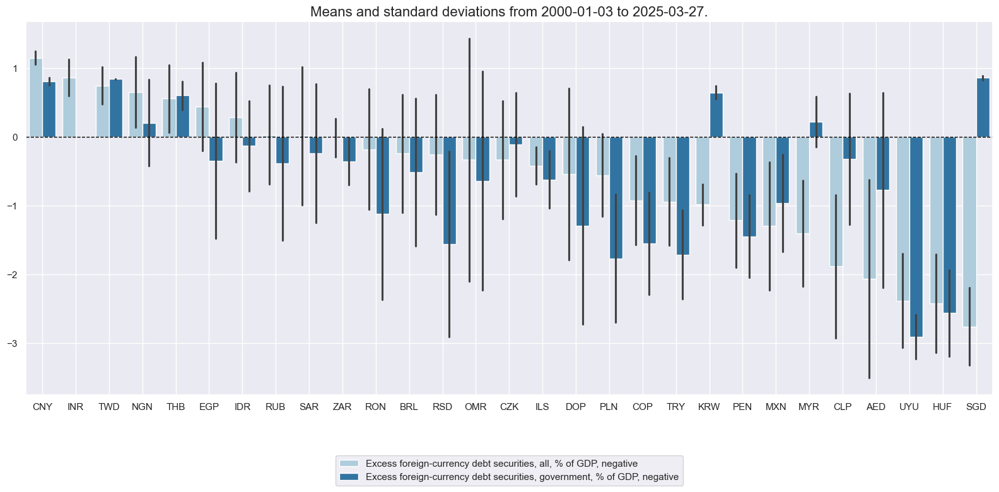

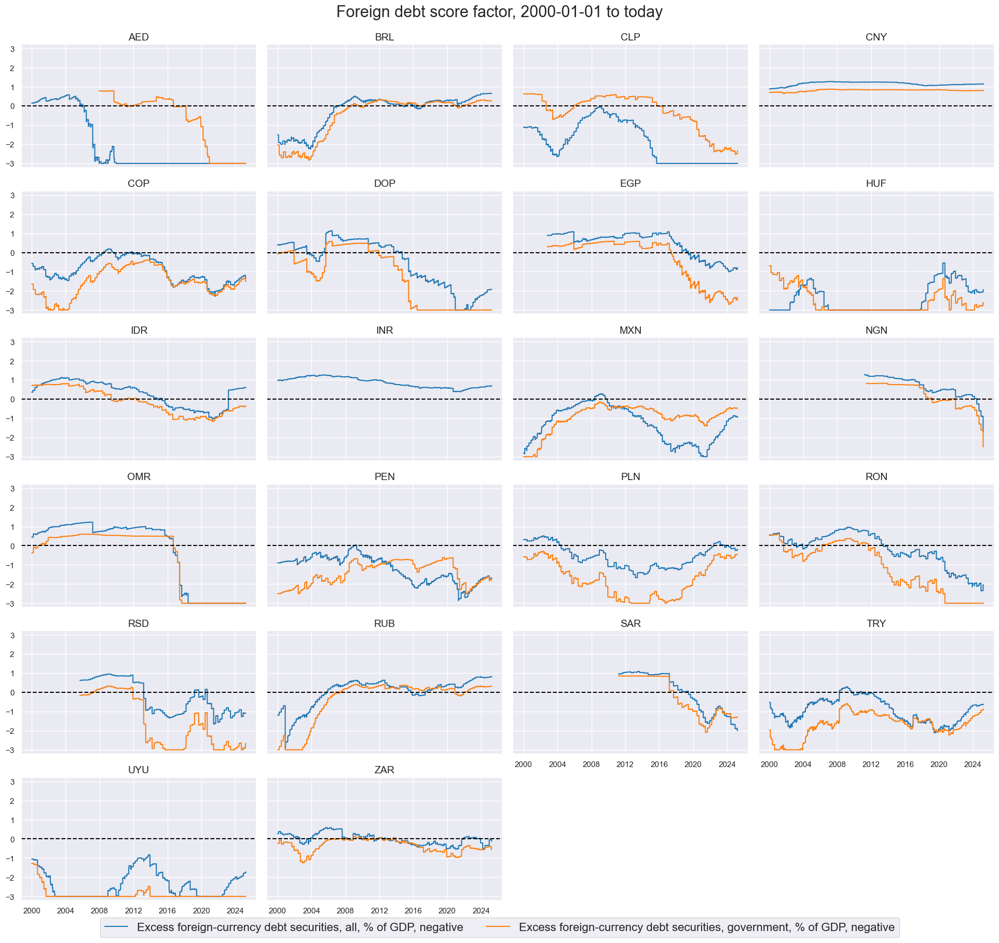

In [17]:
# Box for quantamental score review

factor = "XDEBT"  # "GOVFIN" "XBAL" "XLIAB" "XDEBT" 
xcatx = list(dict_factz[factor])
cidx = cids_fc
sdate = "2000-01-01"

msp.view_ranges(
    dfx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",  # countries sorted by mean of the first category
    start=sdate,
    xcat_labels=dict_labels,
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title=f"{dict_labels[factor+'_ZN']} factor, {sdate} to today",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

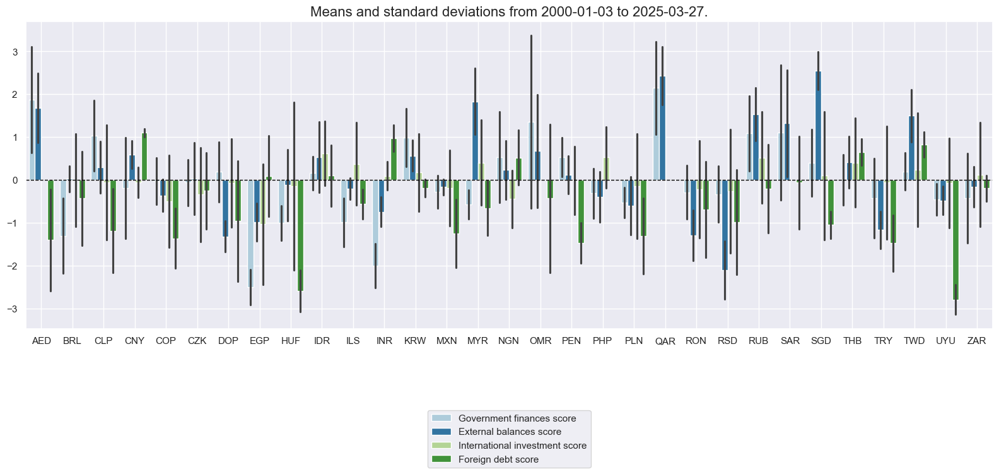

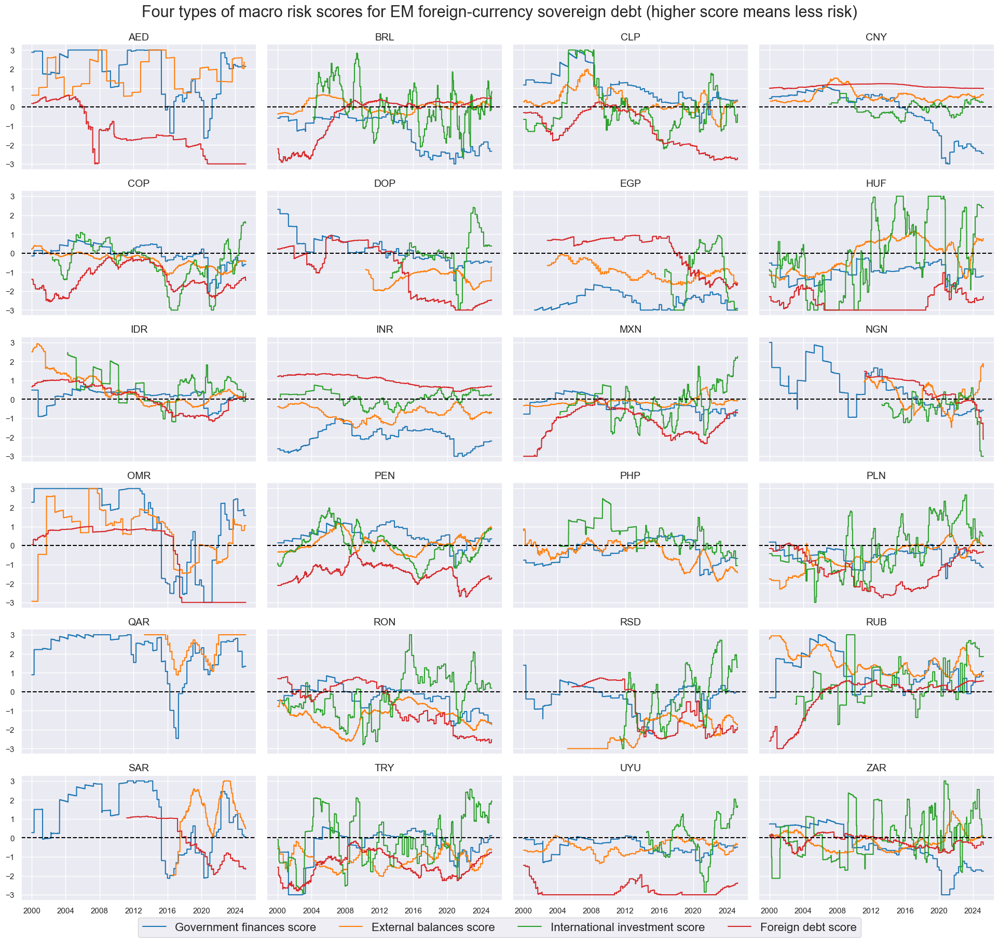

In [18]:
xcatx = macroz
cidx = cids_fc
sdate = "2000-01-01"

msp.view_ranges(
    dfx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by=None,
    start=sdate,
    xcat_labels=dict_labels,
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title=f"Four types of macro risk scores for EM foreign-currency sovereign debt (higher score means less risk)",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

### Spread and rating scores

In [19]:
# Use index carry where CDS spreads not available ("priced risk" score)

msm.missing_in_df(df, xcats=["CDS05YSPRD_NSA"], cids=cids_fc)   # countries without CDS
cidx = ['AED', 'DOP', 'EGP', 'INR', 'NGN', 'OMR', 'QAR', 'RSD', 'SAR', 'UYU']

calcs = ["CDS05YSPRD_NSA = FCBICRY_NSA"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

# Use inverse rating score ("rated risk" score)

calcs = ["LTFCRATING_INV = 1 / LTFCRATING_NSA"]
cidx = cids_fc
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

No missing XCATs across DataFrame.
Missing cids for CDS05YSPRD_NSA:  ['AED', 'DOP', 'EGP', 'INR', 'NGN', 'OMR', 'QAR', 'RSD', 'SAR', 'UYU']


In [20]:
# Normalize spreads and ratings
cidx = cids_fc
xcatx = ["CDS05YSPRD_NSA", "LTFCRATING_INV"]

for xc in xcatx:

    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="median",
        pan_weight=1,
        blacklist=black_fc,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    
    dfx = msm.update_df(dfx, dfa)

In [21]:
dict_labels["CDS05YSPRD_NSA_ZN"] = "Credit spread score"
dict_labels["LTFCRATING_INV_ZN"] = "Rated risk score"

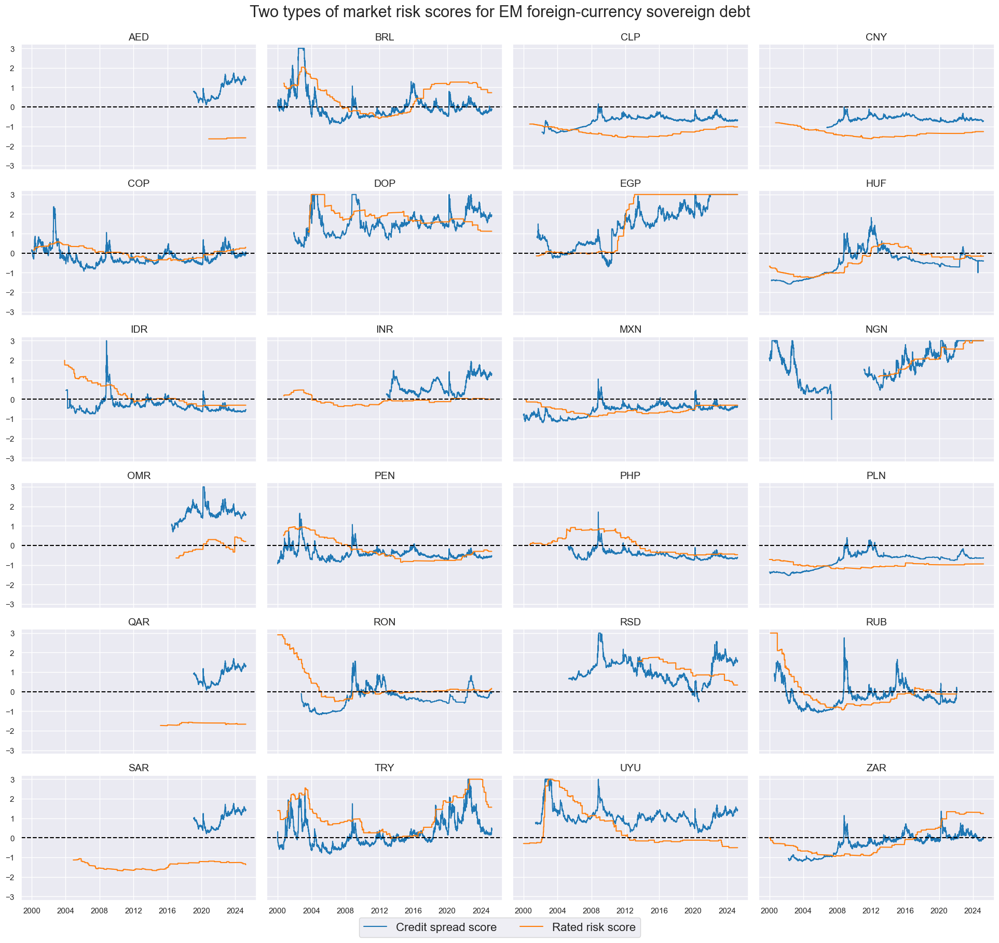

In [22]:
xcatx = ["CDS05YSPRD_NSA_ZN", "LTFCRATING_INV_ZN"]
cidx = cids_fc
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title='Two types of market risk scores for EM foreign-currency sovereign debt',
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
    blacklist=black_fc
)

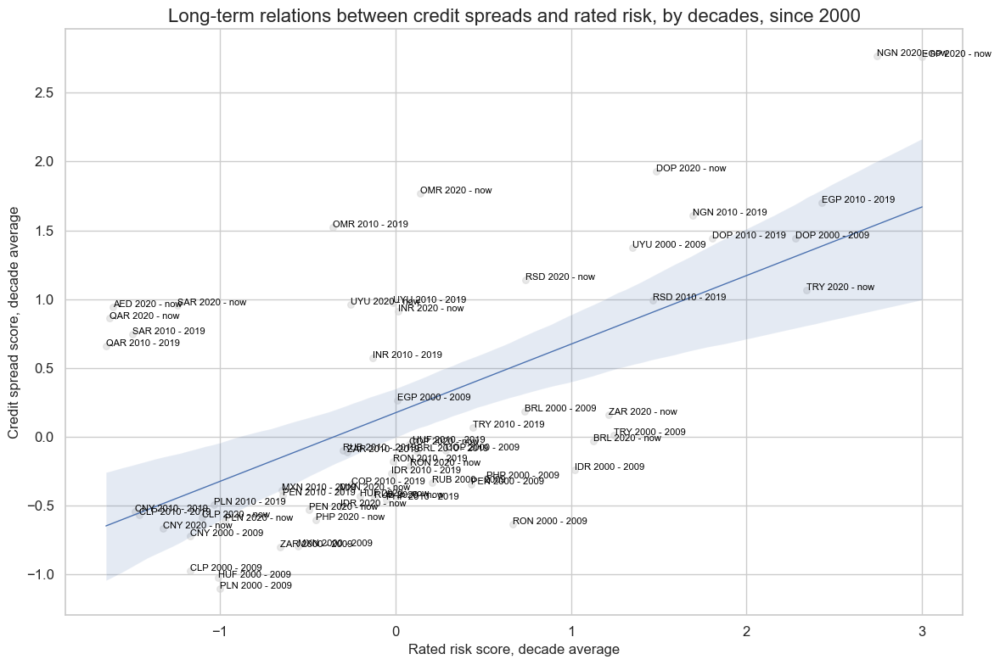

In [23]:
xcatx = ["LTFCRATING_INV_ZN", "CDS05YSPRD_NSA_ZN"]
cidx = cids_fc

cr = msp.CategoryRelations(
    dfx,
    xcats=xcatx,
    cids=cidx,
    years=10,
    lag=0,
    xcat_aggs=["mean", "mean"],
    blacklist=black_fc,
    start="2000-01-01",
)

cr.reg_scatter(
    labels=True,
    label_fontsize=12,
    title="Long-term relations between credit spreads and rated risk, by decades, since 2000",
    title_fontsize=16,
    xlab="Rated risk score, decade average",
    ylab="Credit spread score, decade average",
)

### Macro risk premia

In [24]:
# Calculations of Spread-based premium scores

cidx = cids_fc

calcs_spread = [
    "SPREADvGOVFIN = CDS05YSPRD_NSA_ZN + GOVFIN_ZN",
    "SPREADvXBAL = CDS05YSPRD_NSA_ZN + XBAL_ZN",
    "SPREADvXLIAB = CDS05YSPRD_NSA_ZN + XLIAB_ZN",
    "SPREADvXDEBT = CDS05YSPRD_NSA_ZN + XDEBT_ZN",
]

calcs_rating = [
    "RATINGvGOVFIN = LTFCRATING_INV_ZN + GOVFIN_ZN",
    "RATINGvXBAL = LTFCRATING_INV_ZN + XBAL_ZN",
    "RATINGvXLIAB = LTFCRATING_INV_ZN + XLIAB_ZN",
    "RATINGvXDEBT = LTFCRATING_INV_ZN + XDEBT_ZN",
]

calcs = calcs_spread + calcs_rating

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

spread_macros = ["SPREADvGOVFIN", "SPREADvXBAL", "SPREADvXLIAB", "SPREADvXDEBT"]
rating_macros = ["RATINGvGOVFIN", "RATINGvXBAL", "RATINGvXLIAB", "RATINGvXDEBT"]

In [25]:
dict_labels["SPREADvGOVFIN"] = "Spread-government finances risk premia"
dict_labels["SPREADvXBAL"] = "Spread-external balances risk premia"
dict_labels["SPREADvXLIAB"] = "Spread-international investment risk premia"
dict_labels["SPREADvXDEBT"] = "Spread-foreign debt risk premia"

dict_labels["RATINGvGOVFIN"] = "Rating-government finances risk premia"
dict_labels["RATINGvXBAL"] = "Rating-external balances risk premia"
dict_labels["RATINGvXLIAB"] = "Rating-international investment risk premia"
dict_labels["RATINGvXDEBT"] = "Rating-foreign debt risk premia"

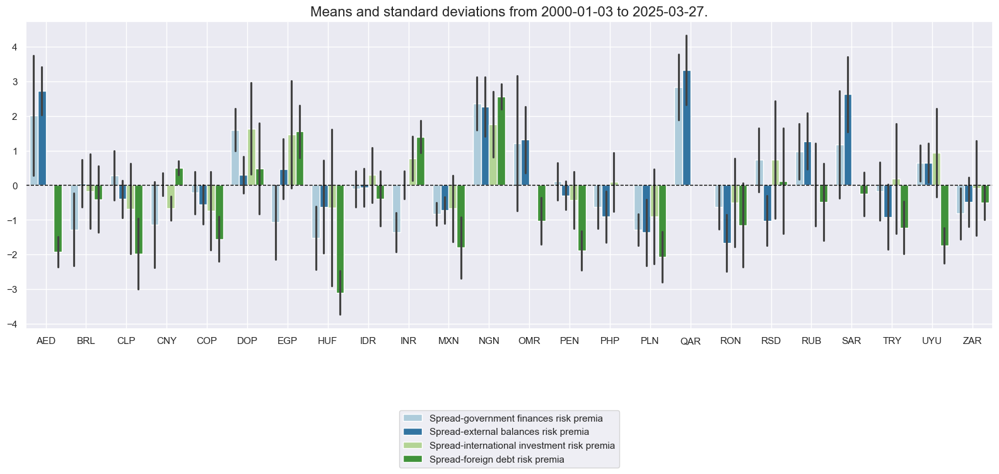

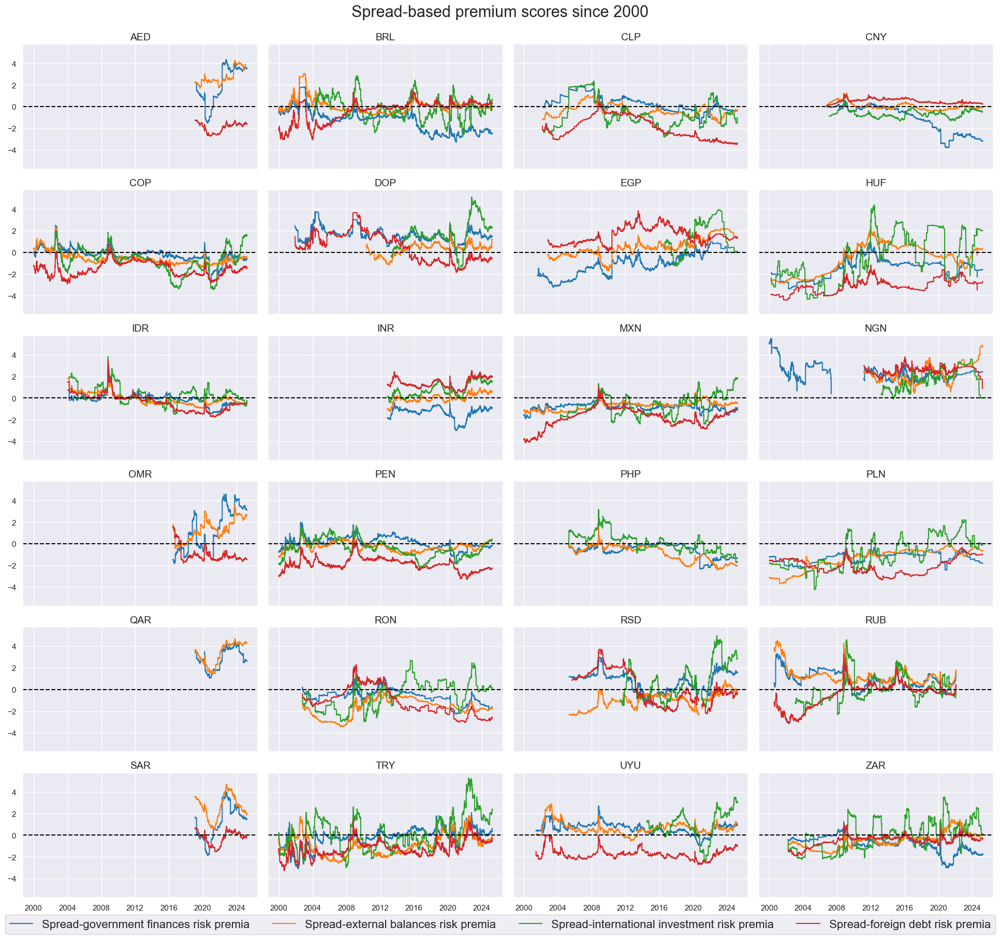

In [26]:
xcatx = spread_macros
cidx = cids_fc
sdate = "2000-01-01"


msp.view_ranges(
    dfx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by=None,
    start=sdate,
    xcat_labels=dict_labels,
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title='Spread-based premium scores since 2000',
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

In [27]:
cidx = cids_fc
dict_risks = {
    "SPREADvMACRO": spread_macros,
    "RATINGvMACRO": rating_macros,
    "RISKvMACRO": ["SPREADvMACRO", "RATINGvMACRO"],
    "RISKxMACRO": ["CDS05YSPRD_NSA_ZN", "LTFCRATING_INV_ZN"],
}

for key, value in dict_risks.items():

    dfa = msp.linear_composite(
        dfx,
        xcats=value,
        cids=cidx,
        complete_xcats=False,
        new_xcat=key,
    )

    dfx = msm.update_df(dfx, dfa)

In [28]:
dict_labels["SPREADvMACRO"] = "Spread-based premium score"
dict_labels["RATINGvMACRO"] = "Rating-based premium score"
dict_labels["RISKvMACRO"] = "Overall macro risk premium score"
dict_labels["RISKxMACRO"] = "Market risk score"

risk_macros = ["SPREADvMACRO", "RATINGvMACRO", "RISKvMACRO"]

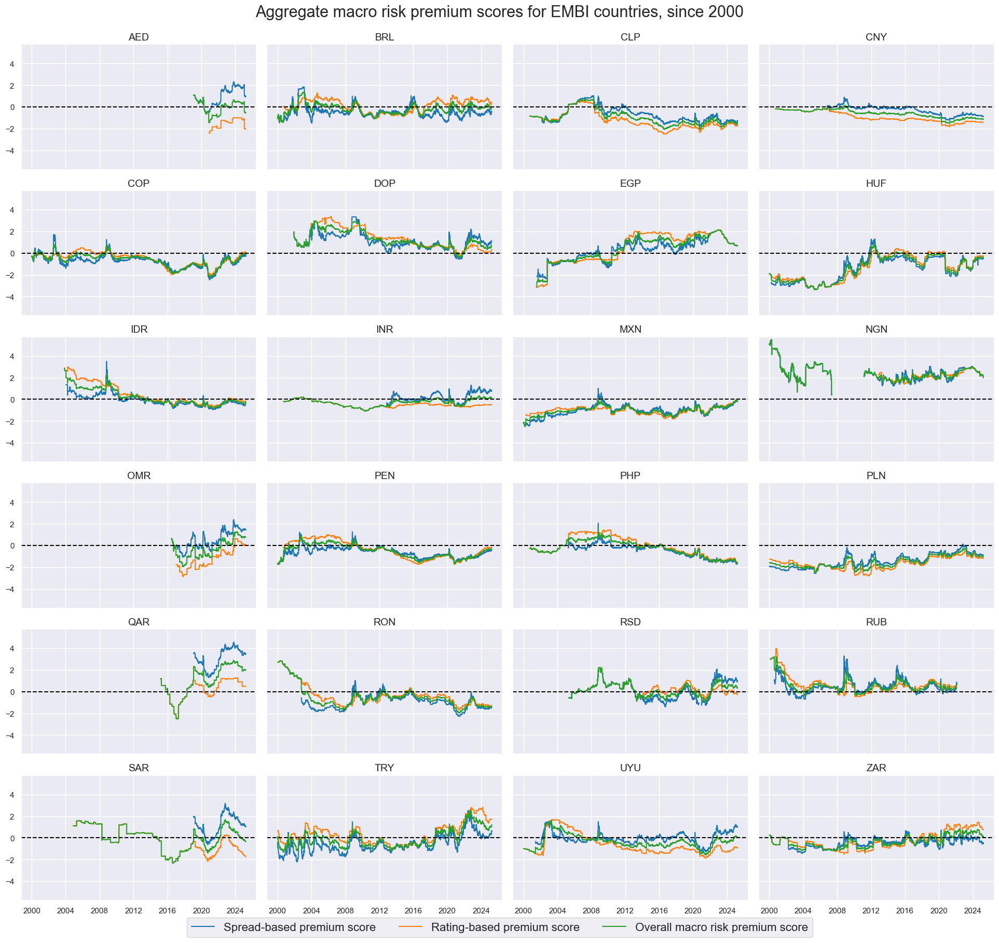

In [29]:
xcatx = risk_macros
cidx = cids_fc
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    blacklist=black_fc,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title="Aggregate macro risk premium scores for EMBI countries, since 2000",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

### Relative macro risk premia

In [30]:
cidx = cids_fc
xcatx = risk_macros + ["RISKxMACRO"] + ["FCBIXR_NSA", "FCBIXR_VT10"]

dfa = msp.make_relative_value(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    start="2000-01-01",
    blacklist=black_fc,
    postfix="vEM",
)

dfx = msm.update_df(dfx, dfa)

risk_macros_vEM = [xcat + "vEM" for xcat in risk_macros]

In [31]:
dict_labels["SPREADvMACROvEM"] = "Relative spread-based premium score"
dict_labels["RATINGvMACROvEM"] = "Relative rating-based premium score"
dict_labels["RISKvMACROvEM"] = "Relative overall macro risk premium score"
dict_labels["RISKxMACROvEM"] = "Relative market risk score"

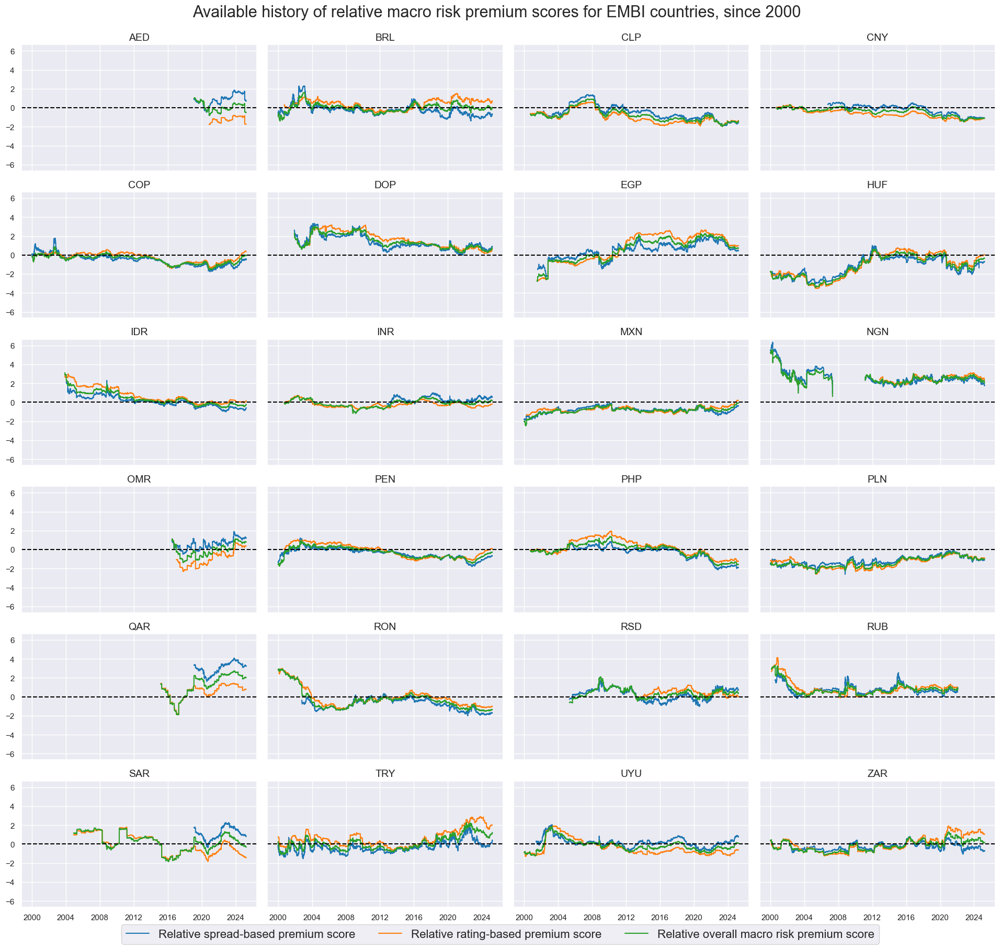

In [32]:
xcatx = risk_macros_vEM
cidx = cids_fc
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=True,
    xcat_labels=dict_labels,
    title="Available history of relative macro risk premium scores for EMBI countries, since 2000",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,

)

## EM foreign currency debt scorecards

### Snapshot

In [33]:
black_fc

{'RUB': [Timestamp('2022-02-01 00:00:00'), Timestamp('2035-02-26 00:00:00')]}

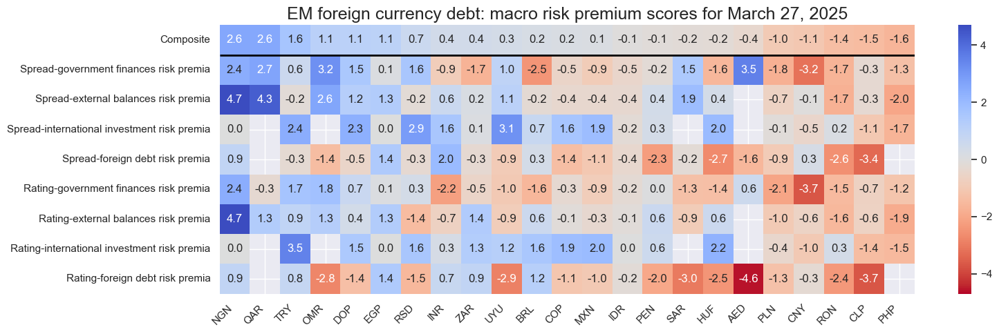

In [34]:
xcatx = spread_macros + rating_macros
cidx = cids_fc

# Set date of snapshot
backdate = datetime.strptime("2025-03-26", "%Y-%m-%d")
lastdate = datetime.strptime(end_date, "%Y-%m-%d")
snapdate = lastdate # lastdate # lastdate or backdate

sv = ScoreVisualisers(
    df=dfx,
    cids=cidx,
    xcats = xcatx,
    no_zn_scores=True,
    rescore_composite=True,
    blacklist = black_fc,
)

sv.view_snapshot(
    cids=cidx,
    date=snapdate,
    transpose=True,
    sort_by_composite = True,
    title=f"EM foreign currency debt: macro risk premium scores for {snapdate.strftime('%B %d, %Y')}",
    title_fontsize=18,
    figsize=(16, 5),
    xcats=xcatx + ["Composite"],
    xcat_labels=dict_labels,
    round_decimals=1,
)

### History

Latest day:  2025-03-27 00:00:00


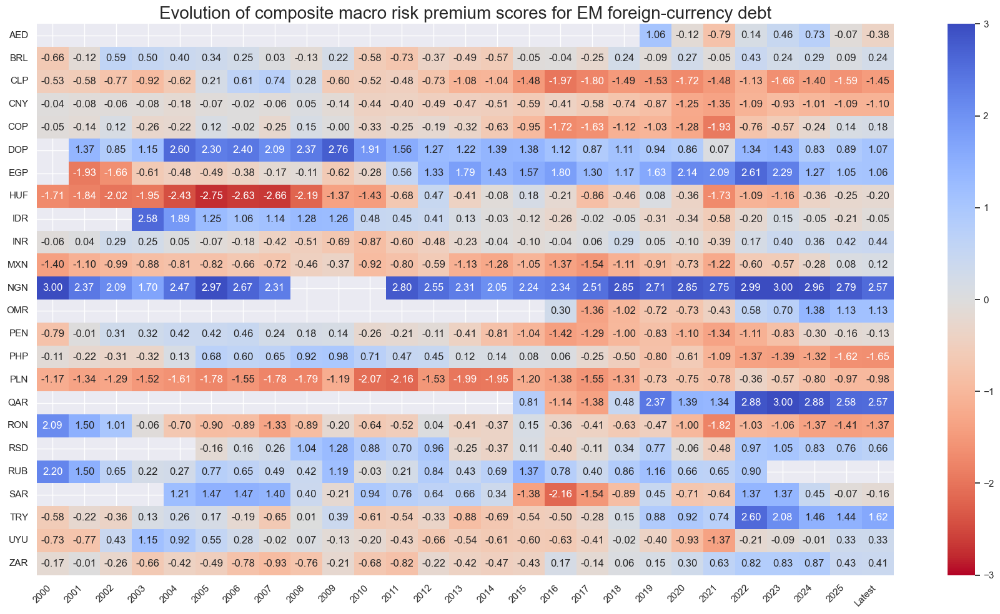

In [35]:
sv.view_score_evolution(
    xcat="Composite",
    cids=cidx,
    freq="A",
    include_latest_day=True,
    transpose=False,
    title="Evolution of composite macro risk premium scores for EM foreign-currency debt",
    start="2000-01-01",
    figsize=(18, 10),
)

### Country focus

Latest day:  2025-03-27 00:00:00


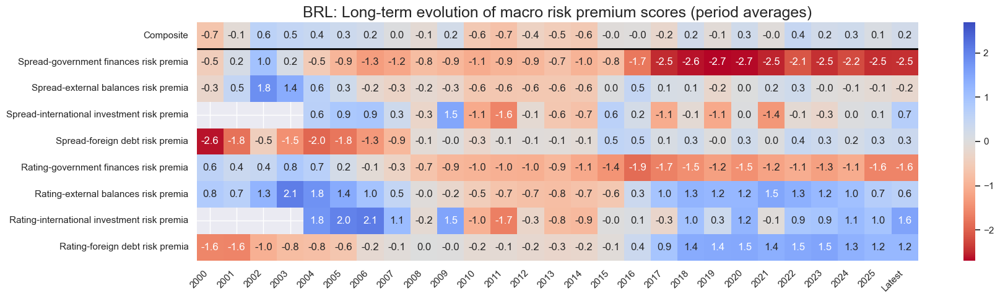

In [36]:
cid = "BRL"
xcatx = spread_macros + rating_macros + ["Composite"]

sv.view_cid_evolution(
    cid=cid,
    xcats=xcatx,
    xcat_labels=dict_labels,
    freq="A",
    transpose=False,
    title=f"{cid}: Long-term evolution of macro risk premium scores (period averages)",
    title_fontsize=18,
    figsize=(18, 5),
    round_decimals=1,
    start="2000-01-01",
)

## Value checks

### Simple directional signals

#### Specs and panel test

In [37]:
dict_dir = {
    "sigs": risk_macros + ["RISKxMACRO"],
    "targ": "FCBIXR_NSA",
    "cidx": cids_fc,
    "start": "2000-01-01",
    "black": black_fc,
    "srr": None,
    "pnls": None,
}

SPREADvXLIAB misses: ['AED', 'OMR', 'QAR', 'SAR'].
SPREADvXDEBT misses: ['PHP', 'QAR'].


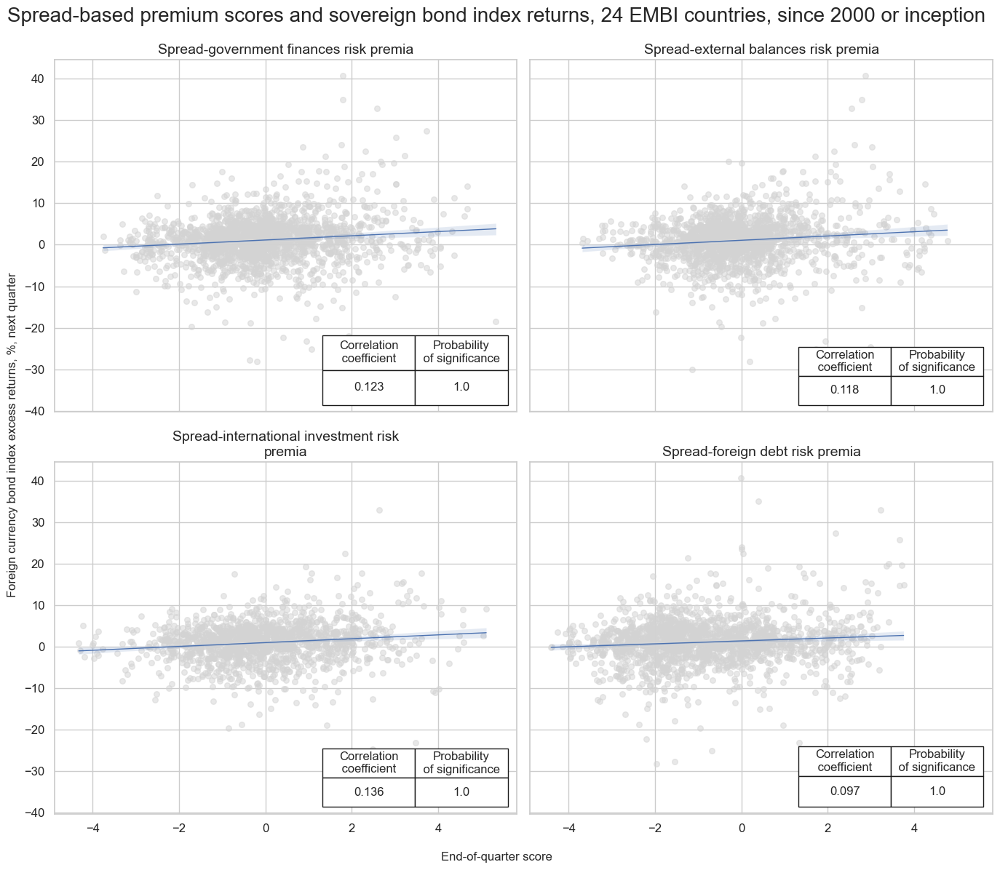

In [38]:
dix = dict_dir

sigs = spread_macros
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

catregs = {}
for sig in sigs:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=black_fc,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=2,
    nrow=2,
    figsize=(14, 12),
    title="Spread-based premium scores and sovereign bond index returns, 24 EMBI countries, since 2000 or inception",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="End-of-quarter score",
    ylab="Foreign currency bond index excess returns, %, next quarter",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[dict_labels[key] for key in sigs]
)

RATINGvXLIAB misses: ['AED', 'OMR', 'QAR', 'SAR'].
RATINGvXDEBT misses: ['PHP', 'QAR'].


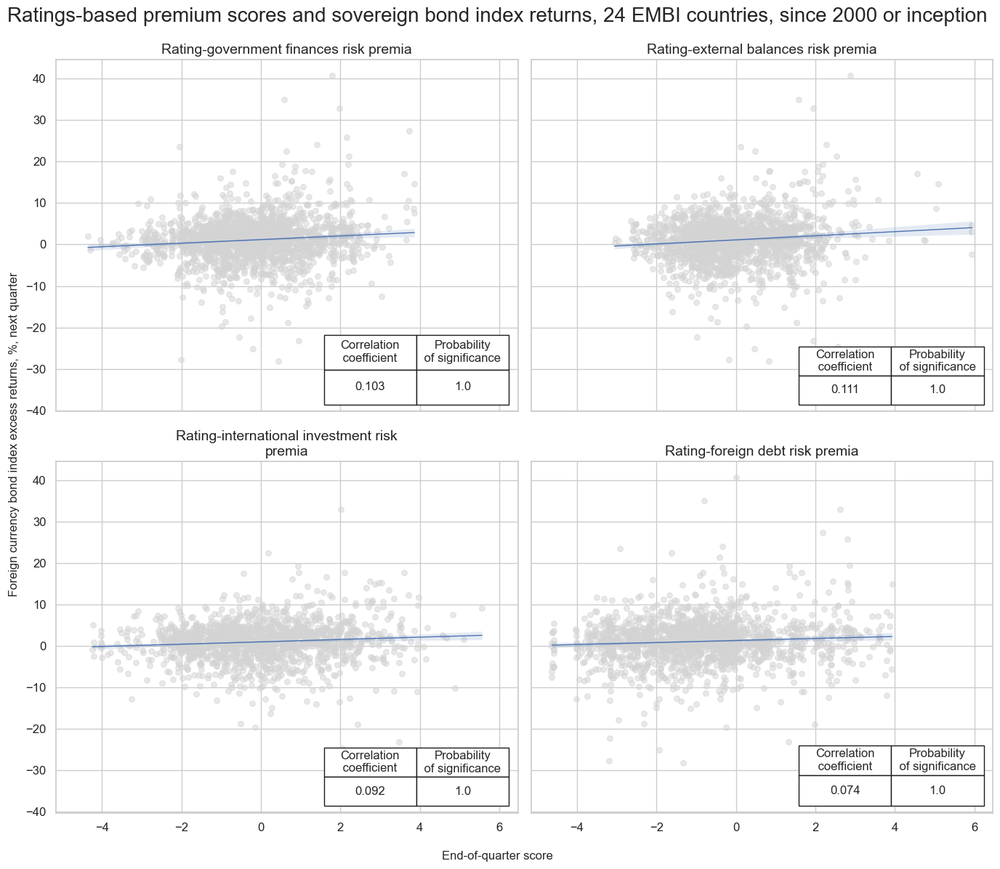

In [39]:
dix = dict_dir

sigs = rating_macros
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

catregs = {}
for sig in sigs:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=black_fc,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=2,
    nrow=2,
    figsize=(14, 12),
    title="Ratings-based premium scores and sovereign bond index returns, 24 EMBI countries, since 2000 or inception",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="End-of-quarter score",
    ylab="Foreign currency bond index excess returns, %, next quarter",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[dict_labels[key] for key in sigs]
)

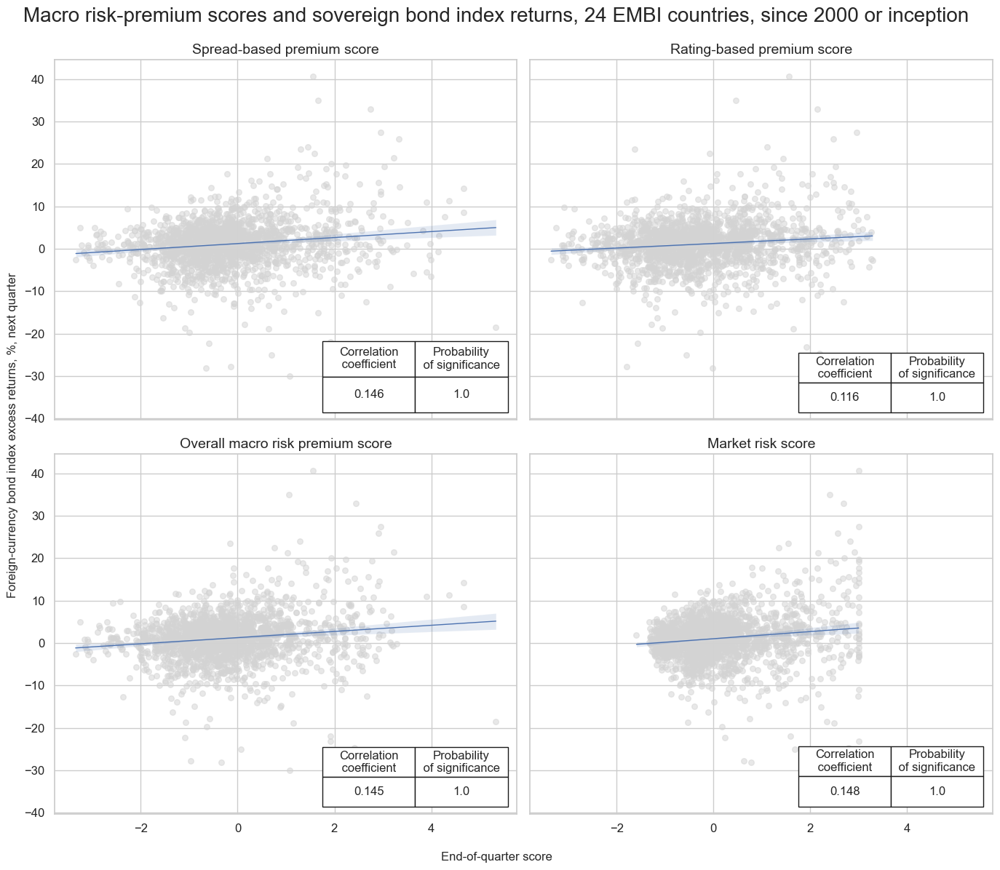

In [40]:
dix = dict_dir

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

catregs = {}
for sig in sigs:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        # xcat_trims=[50, 50],  # remove single outlier
        start=start,
        blacklist=black_fc,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=2,
    nrow=2,
    figsize=(14, 12),
    title="Macro risk-premium scores and sovereign bond index returns, 24 EMBI countries, since 2000 or inception",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="End-of-quarter score",
    ylab="Foreign-currency bond index excess returns, %, next quarter",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[dict_labels[key] for key in sigs]
)

#### Accuracy

In [41]:
dix = dict_dir

sigs = dix["sigs"]
rets = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

freqs = ["M"]

srr = mss.SignalReturnRelations(
    dfx,
    sigs=sigs,
    rets=rets,
    freqs=freqs,
    blacklist=black_fc,
    start=start,
    slip=1
)

dix["srr"] = srr

In [42]:
dix = dict_dir
srr = dix["srr"]

tbl=srr.multiple_relations_table().round(3)
display(tbl.loc[:, ["accuracy", "bal_accuracy", "pos_sigr", "pos_retr"]])

accuracy  bal_accuracy  pos_sigr  pos_retr
Return     Signal       Frequency Aggregation                                            
FCBIXR_NSA RATINGvMACRO M         last            0.485         0.518     0.354     0.606
           RISKvMACRO   M         last            0.487         0.520     0.354     0.608
           RISKxMACRO   M         last            0.508         0.515     0.467     0.607
           SPREADvMACRO M         last            0.480         0.513     0.351     0.606

#### Naive PnL

In [43]:
dix = dict_dir

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=black,
    bms=bms,
)
for sig in sigs:
    pnls.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        thresh=1,
        sig_add = 1,
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=10,
    )
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

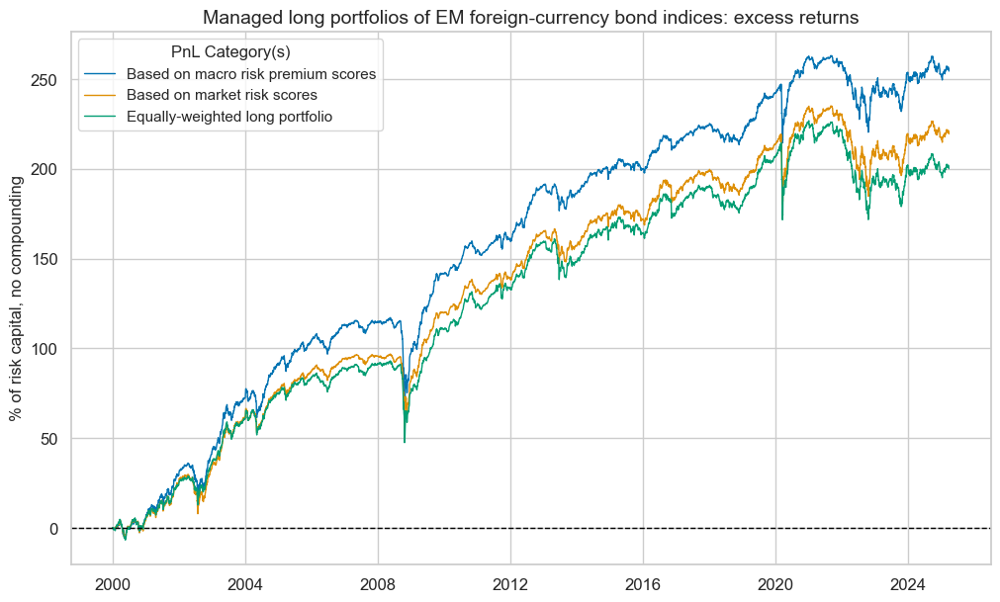

xcat,PNL_RISKvMACRO,PNL_RISKxMACRO,Long only
Return %,10.086282,8.699071,7.931267
St. Dev. %,10.0,10.0,10.0
Sharpe Ratio,1.008628,0.869907,0.793127
Sortino Ratio,1.396034,1.192898,1.070307
Max 21-Day Draw %,-46.602394,-38.265147,-40.965664
Max 6-Month Draw %,-54.460819,-41.889435,-44.858775
Peak to Trough Draw %,-55.093225,-50.318638,-55.111764
Top 5% Monthly PnL Share,0.565154,0.634878,0.655361
USD_EQXR_NSA correl,0.288231,0.306169,0.275905
UHY_CRXR_NSA correl,0.356278,0.37949,0.348014


In [44]:
dix = dict_dir
pnls = dix["pnls"]

pnls.plot_pnls(
    title="Managed long portfolios of EM foreign-currency bond indices: excess returns",
    pnl_cats=["PNL_RISKvMACRO", "PNL_RISKxMACRO"] + ["Long only"],
    xcat_labels=["Based on macro risk premium scores", "Based on market risk scores", "Equally-weighted long portfolio"],
    title_fontsize=14,
)
pnls.evaluate_pnls(pnl_cats=["PNL_RISKvMACRO", "PNL_RISKxMACRO"] + ["Long only"])

### Vol-targeted positions

#### Specs and panel test

In [45]:
dict_dvt = {
    "sigs": risk_macros + ["RISKxMACRO"],
    "targ": "FCBIXR_VT10",
    "cidx": cids_fc,
    "start": "2000-01-01",
    "black": black_fc,
    "srr": None,
    "pnls": None,
}

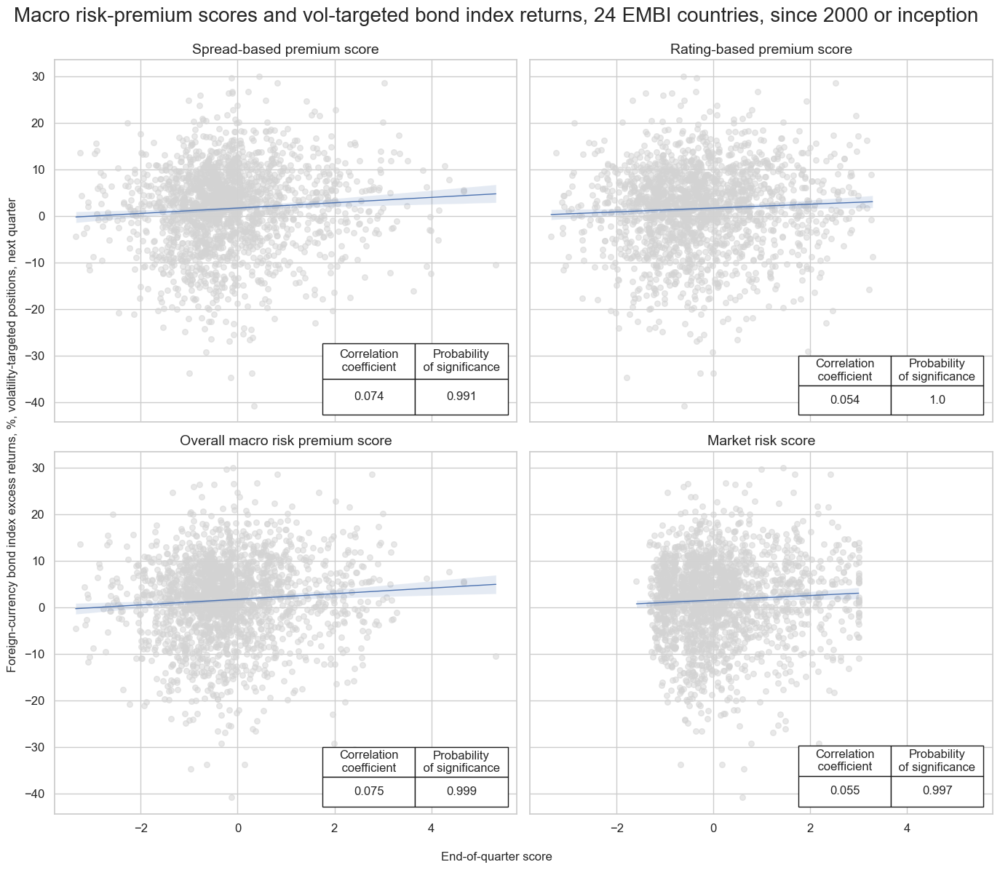

In [46]:
dix = dict_dvt

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

catregs = {}
for sig in sigs:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=black_fc,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=2,
    nrow=2,
    figsize=(14, 12),
    title="Macro risk-premium scores and vol-targeted bond index returns, 24 EMBI countries, since 2000 or inception",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="End-of-quarter score",
    ylab="Foreign-currency bond index excess returns, %, volatility-targeted positions, next quarter",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[dict_labels[key] for key in sigs]
)

#### Accuracy

In [47]:
dix = dict_dvt

sigs = dix["sigs"]
rets = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

freqs = ["M"]

srr = mss.SignalReturnRelations(
    dfx,
    sigs=sigs,
    rets=rets,
    freqs=freqs,
    blacklist=black_fc,
    start=start,
    slip=1
)

dix["srr"] = srr

In [48]:
dix = dict_dvt
srr = dix["srr"]

tbl=srr.multiple_relations_table().round(3)
display(tbl.loc[:, ["accuracy", "bal_accuracy", "pos_sigr", "pos_retr"]])

accuracy  bal_accuracy  pos_sigr  pos_retr
Return      Signal       Frequency Aggregation                                            
FCBIXR_VT10 RATINGvMACRO M         last            0.487         0.519     0.354     0.603
            RISKvMACRO   M         last            0.487         0.520     0.354     0.605
            RISKxMACRO   M         last            0.509         0.516     0.467     0.605
            SPREADvMACRO M         last            0.480         0.512     0.351     0.603

#### Naive PnL

In [49]:
dix = dict_dvt

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=black,
    bms=bms,
)
for sig in sigs:
    pnls.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        sig_add=1,
        thresh=1,
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=10,
    )
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

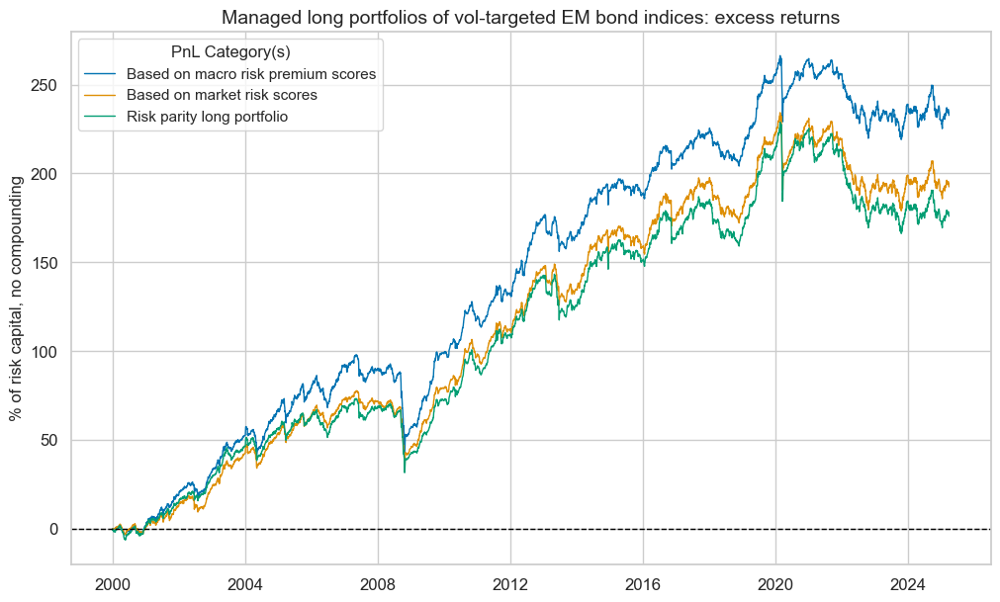

xcat,PNL_RISKvMACRO,PNL_RISKxMACRO,Long only
Return %,9.222642,7.62826,6.970166
St. Dev. %,10.0,10.0,10.0
Sharpe Ratio,0.922264,0.762826,0.697017
Sortino Ratio,1.239685,1.010269,0.918472
Max 21-Day Draw %,-37.135863,-43.183415,-42.952576
Max 6-Month Draw %,-50.187556,-37.888666,-38.226275
Peak to Trough Draw %,-56.289829,-55.307603,-62.665322
Top 5% Monthly PnL Share,0.596767,0.702271,0.780514
USD_EQXR_NSA correl,0.25207,0.270382,0.221496
UHY_CRXR_NSA correl,0.307254,0.32819,0.279345


In [50]:
dix = dict_dvt
pnls = dix["pnls"]

pnls.plot_pnls(
    title="Managed long portfolios of vol-targeted EM bond indices: excess returns",
    pnl_cats=["PNL_RISKvMACRO", "PNL_RISKxMACRO"] + ["Long only"],
    xcat_labels=["Based on macro risk premium scores", "Based on market risk scores", "Risk parity long portfolio"],
    title_fontsize=14,
)
pnls.evaluate_pnls(pnl_cats=["PNL_RISKvMACRO", "PNL_RISKxMACRO"] + ["Long only"])

### Relative value positions

#### Specs and panel test

In [51]:
dict_rv = {
    "sigs": risk_macros_vEM + ["RISKxMACROvEM"],
    "targ": "FCBIXR_VT10vEM",
    "cidx": cids_fc,
    "start": "2000-01-01",
    "black": black_fc,
    "srr": None,
    "pnls": None,
}

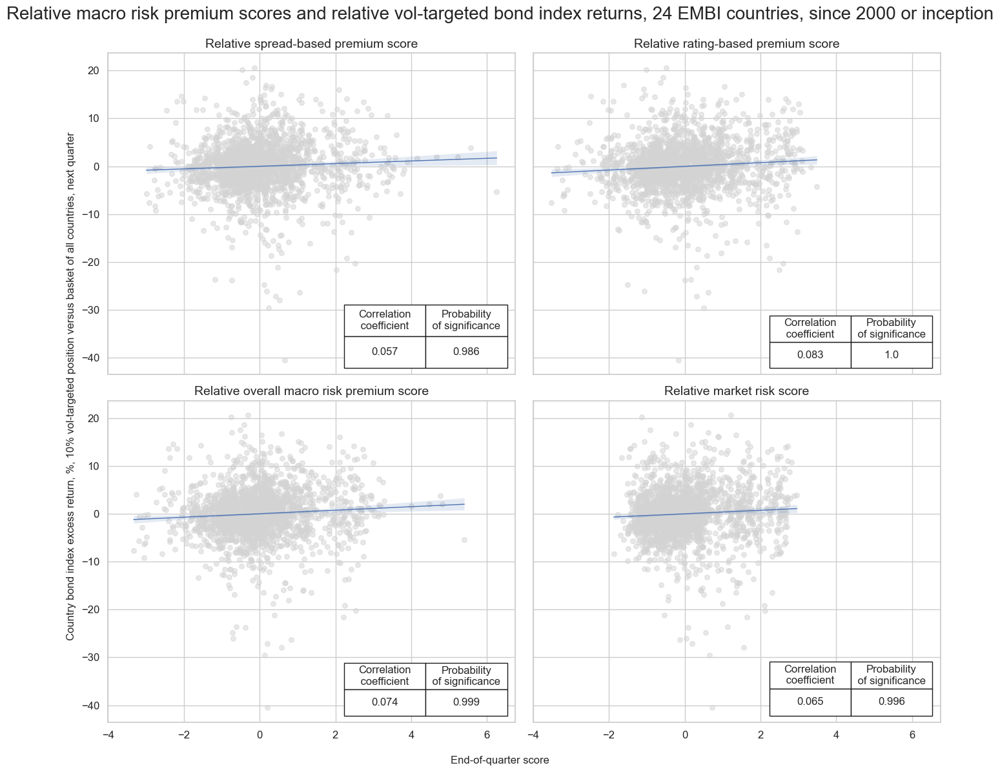

In [52]:
dix = dict_rv

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

catregs = {}
for sig in sigs:
    catregs[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, ret],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=black_fc,
    )

msv.multiple_reg_scatter(
    cat_rels=[v for k, v in catregs.items()],
    ncol=2,
    nrow=2,
    figsize=(14, 12),
    title="Relative macro risk premium scores and relative vol-targeted bond index returns, 24 EMBI countries, since 2000 or inception",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="End-of-quarter score",
    ylab="Country bond index excess return, %, 10% vol-targeted position versus basket of all countries, next quarter",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[dict_labels[key] for key in sigs]
)

#### Accuracy

In [53]:
dix = dict_rv

sigs = dix["sigs"]
rets = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

freqs = ["M"]

srr = mss.SignalReturnRelations(
    dfx,
    sigs=sigs,
    rets=rets,
    freqs=freqs,
    blacklist=black_fc,
    start=start,
    slip=1
)

dix["srr"] = srr

In [54]:
dix = dict_rv
srr = dix["srr"]

tbl=srr.multiple_relations_table().round(3)
display(tbl.loc[:, ["accuracy", "bal_accuracy", "pos_sigr", "pos_retr"]])

accuracy  bal_accuracy  pos_sigr  pos_retr
Return         Signal          Frequency Aggregation                                            
FCBIXR_VT10vEM RATINGvMACROvEM M         last            0.523         0.523     0.464     0.502
               RISKvMACROvEM   M         last            0.527         0.528     0.446     0.504
               RISKxMACROvEM   M         last            0.526         0.527     0.442     0.504
               SPREADvMACROvEM M         last            0.522         0.522     0.449     0.503

#### Naive PnL

In [55]:
dix = dict_rv

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=black,
    bms=bms,
)
for sig in sigs:
    pnls.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        thresh=1,
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=10,
    )

dix["pnls"] = pnls

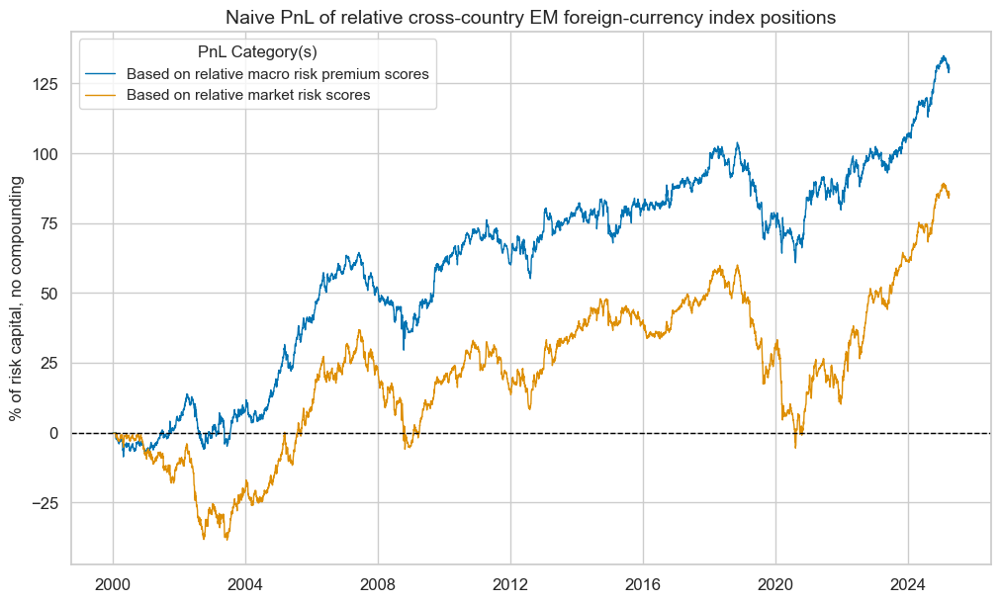

xcat,PNL_RISKvMACROvEM,PNL_RISKxMACROvEM
Return %,5.150947,3.366461
St. Dev. %,10.0,10.0
Sharpe Ratio,0.515095,0.336646
Sortino Ratio,0.740373,0.467092
Max 21-Day Draw %,-15.526189,-23.165584
Max 6-Month Draw %,-25.876187,-33.566946
Peak to Trough Draw %,-43.094496,-65.589155
Top 5% Monthly PnL Share,0.854825,1.430886
USD_EQXR_NSA correl,0.14404,0.23967
UHY_CRXR_NSA correl,0.148551,0.250277


In [56]:
dix = dict_rv
pnls = dix["pnls"]

pnls.plot_pnls(
    title="Naive PnL of relative cross-country EM foreign-currency index positions",
    pnl_cats=["PNL_RISKvMACROvEM", "PNL_RISKxMACROvEM"],
    xcat_labels=["Based on relative macro risk premium scores", "Based on relative market risk scores"],
    title_fontsize=14,
)
pnls.evaluate_pnls(pnl_cats=["PNL_RISKvMACROvEM", "PNL_RISKxMACROvEM"])

## EMBI Global proxy and modification

### Import EMBI global weights

In [57]:
# Dictionary for labelling and mapping

dict_cids = {
    "AED": ["AE", "UAE"],
    "ARS": ["AR", "Argentina"],
    "BRL": ["BR", "Brazil"],
    "CLP": ["CL", "Chile"],
    "CNY": ["CN", "China"],
    "COP": ["CO", "Colombia"],
    "EGP": ["EG", "Egypt"],
    "DOP": ["DO", "Dominican Republic"],
    "HUF": ["HU", "Hungary"],
    "IDR": ["ID", "Indonesia"],
    "INR": ["IN", "India"],
    "MXN": ["MX", "Mexico"],
    "MYR": ["MY", "Malaysia"],
    "NGN": ["NG", "Nigeria"],
    "OMR": ["OM", "Oman"],
    "PAB": ["PA", "Panama"],
    "PEN": ["PE", "Peru"],
    "PHP": ["PH", "Philippines"],
    "PLN": ["PL", "Poland"],
    "QAR": ["QA", "Qatar"],
    "SAR": ["SA", "Saudi Arabia"],
    "RON": ["RO", "Romania"],
    "RSD": ["CS", "Serbia"],
    "RUB": ["RU", "Russia"],
    "THB": ["TH", "Thailand"],
    "TRY": ["TR", "Turkey"],
    "UYU": ["UY", "Uruguay"],
    "VEF": ["VE", "Venezuela"],
    "ZAR": ["ZA", "South Africa"],
}

In [58]:
# Import EMBI weights from DataQuery

## Mapping dataframe

expression_mapping_csv = "expression,country,cid\n"
DQ_ticker = "StatIndxWght"

for cid in cids_fc:
    expression_mapping_csv += f'"DB(SAGE,FC_EMBIG_{dict_cids[cid][0]},{DQ_ticker})",{dict_cids[cid][0]},{cid}\n'
df_map = pd.read_csv(io.StringIO(expression_mapping_csv), sep=",")

extra_expression = {
    "expression": "DB(SAGE,EMBIG,AM_IDX_TOT)",
    "country": "ALL",
    "cid": "ALL",
    "ticker": "ALL_EMBI_IDX",
}
df_map["ticker"] = df_map["cid"] + "_" + "EMBIWGT"
df_map = pd.concat([df_map, pd.DataFrame([extra_expression])], ignore_index=True)

## Download wide dataframe from J.P. Morgan DataQuery

with JPMaQSDownload() as downloader:

    dfw_weights = downloader.download(
        expressions=df_map["expression"].tolist(),
        start_date="1998-01-01",
        dataframe_format="wide",
        show_progress=True,
    )

    dfw_weights = dfw_weights.rename(columns=df_map.set_index("expression")["ticker"].to_dict())

st, ed = dfw_weights.index.min(), dfw_weights.index.max()
bdates = pd.bdate_range(st, ed, freq="B")

# Forward filling weights and convert to quantamental dataframe (and merge)

dfw_weights = dfw_weights.reindex(bdates).ffill()
dfw_weights.index.name = "real_date"
df_embi = msm.utils.ticker_df_to_qdf(dfw_weights)

dfx = msm.update_df(dfx, df_embi)

Timestamp UTC:  2025-03-28 16:03:08
Connection successful!


Requesting data: 100%|████████████████████████████| 2/2 [00:00<00:00,  4.89it/s]


Some dates are missing from the downloaded data. 
301 out of 7106 dates are missing.


### Normalise weights and show EMBI coverage

In [59]:
mask = dfx["xcat"] == "EMBIWGT"
dfx.loc[mask, "value"] = dfx.loc[mask].groupby("real_date")["value"].transform(lambda x: (x / x.sum() ) * 1 )

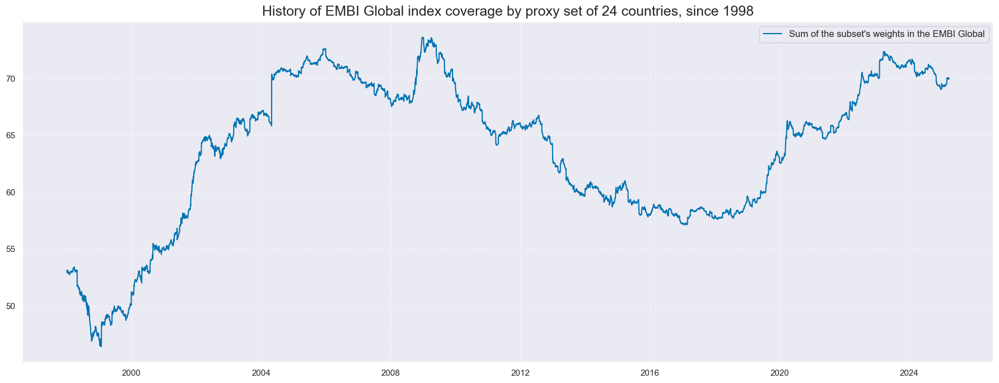

In [60]:
df_sum = df_embi[df_embi['xcat'] == 'EMBIWGT' ]

df_sum = (
    df_sum.groupby("real_date")["value"]
    .sum()
    .reset_index()
    .assign(xcat="SUM", cid='ALL')
)

df_sum = df_sum[["real_date", "cid", "xcat", "value"]]
df_sum['value'] = df_sum['value']

msp.view_timelines(
    df_sum,
    xcats=['SUM'],
    cids=['ALL'],
    start="1998-01-01",
    title="History of EMBI Global index coverage by proxy set of 24 countries, since 1998",
    size=(18, 7),
    xcat_labels=["Sum of the subset's weights in the EMBI Global"]
)

### Modified weights

#### Calculation

In [61]:
cidx = cids_fc
xcatx = risk_macros_vEM + risk_macros

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

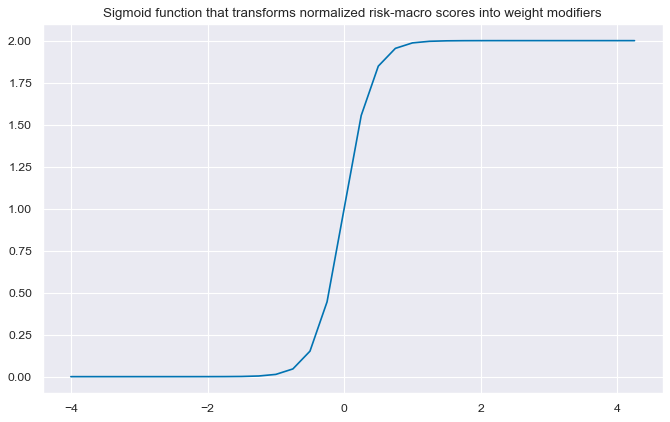

In [62]:
# Define appropriate sigmoid function for adjusting weights

amplitude = 2
steepness = 5
midpoint = 0


def sigmoid(x, a=amplitude, b=steepness, c=midpoint):
    return a / (1 + np.exp(-b * (x - c)))


ar = np.array([i / 4 for i in range(-16, 18)])
plt.figure(figsize=(10, 6), dpi=80)
plt.plot(ar, sigmoid(ar))
plt.title("Sigmoid function that transforms normalized risk-macro scores into weight modifiers")
plt.show()

# Calculate adjusted weights

dfj = adjust_weights(
    dfx,
    weights_xcat="EMBIWGT",
    adj_zns_xcat="RISKvMACRO_ZN",
    method="generic",
    adj_func=sigmoid,
    blacklist=black_fc,
    cids=cidx,
    adj_name="EMBIWGT_MOD",
)
dfj["value"] = dfj["value"]  # remove after change in function
dfx = msm.update_df(dfx, dfj)

dict_labels["EMBIWGT"] = "EMBI Global proxy weights"
dict_labels["EMBIWGT_MOD"] = "EMBIG weights modified by macro risk premia"

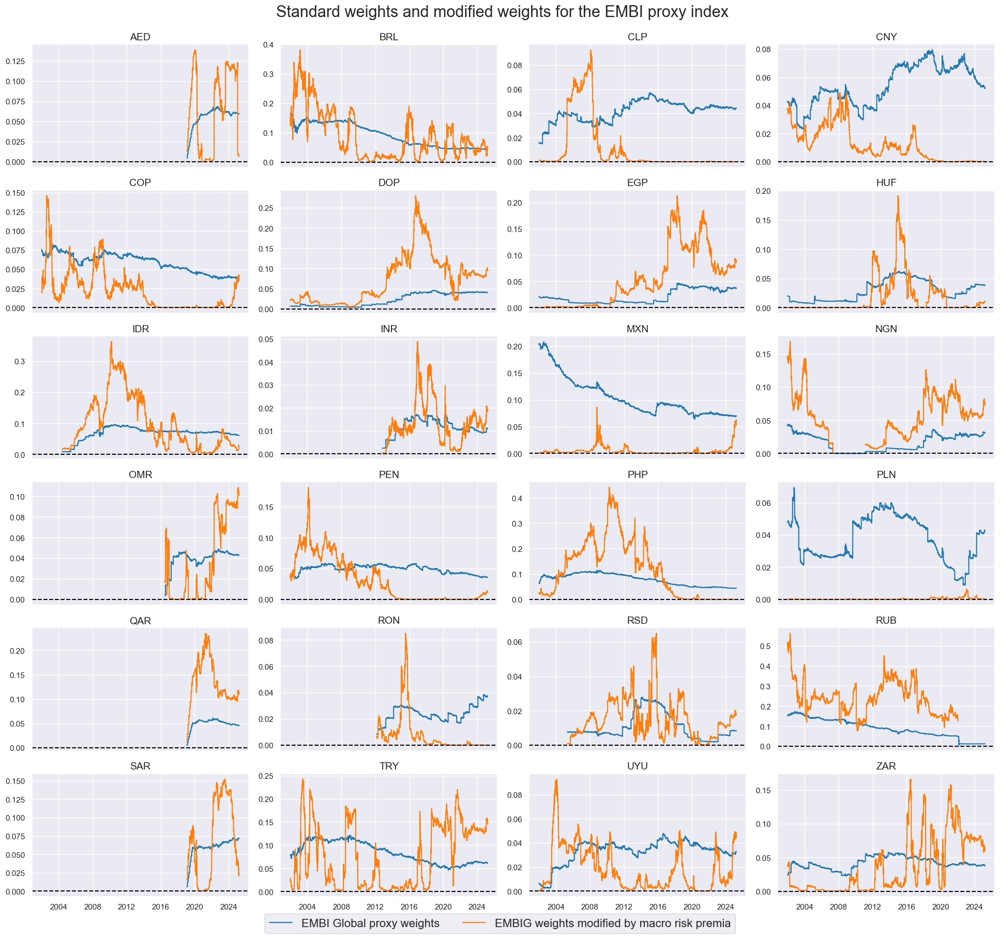

In [63]:
# View timelines of weights

xcatx = ["EMBIWGT", "EMBIWGT_MOD"]
cidx = cids_fc
sdate = "2002-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=False,
    xcat_labels=dict_labels,
    title="Standard weights and modified weights for the EMBI proxy index",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

#### Evaluation

In [64]:
dict_mod = {
    "sigs": ["EMBIWGT_MOD", "EMBIWGT"],
    "targ": "FCBIR_NSA",
    "cidx": cids_fc,
    "start": "2002-01-01",
    "black": black_fc,
    "srr": None,
    "pnls": None,
}

In [65]:
dix = dict_mod

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=black,
    bms=bms,
)
for sig in sigs:
    pnls.make_pnl(
        sig=sig,
        sig_op="raw",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=None,
    )

dix["pnls"] = pnls

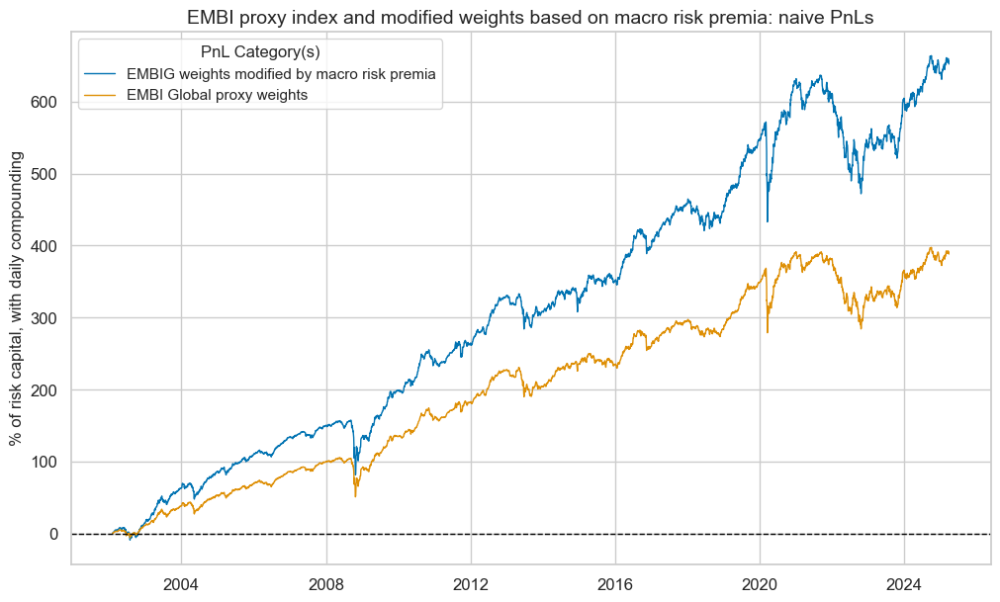

xcat,PNL_EMBIWGT_MOD,PNL_EMBIWGT
Return %,9.006917,7.050288
St. Dev. %,7.538961,6.269362
Sharpe Ratio,1.194716,1.124562
Sortino Ratio,1.669615,1.550268
Max 21-Day Draw %,-29.591046,-25.999432
Max 6-Month Draw %,-33.380698,-29.848671
Peak to Trough Draw %,-33.817476,-30.147379
Top 5% Monthly PnL Share,0.430583,0.452107
USD_EQXR_NSA correl,0.298719,0.298464
UHY_CRXR_NSA correl,0.364947,0.3759


In [66]:
dix = dict_mod
pnls = dix["pnls"]
sigs = dix["sigs"]
pnl_cats=["PNL_" + sig for sig in sigs]

pnls.plot_pnls(
    title="EMBI proxy index and modified weights based on macro risk premia: naive PnLs",
    pnl_cats=pnl_cats,
    xcat_labels=[dict_labels[k] for k in sigs],
    title_fontsize=14,
    compounding=True,
)
pnls.evaluate_pnls(pnl_cats=pnl_cats)

### Adjusted weights

In [67]:
dfa = msp.adjust_weights(
    df=dfx,
    weights_xcat="EMBIWGT",
    adj_zns_xcat="RISKvMACRO_ZN",
    method="lincomb",
    params=dict(min_score=-3, coeff_new=0.5),
    blacklist=black_fc,
    adj_name="EMBIWGT_ADJ",
)

dfx = msm.update_df(dfx, dfa)

dict_labels["EMBIWGT_ADJ"] = (
    "EMBIG weights adjusted towards weights of macro risk premium scores"
)

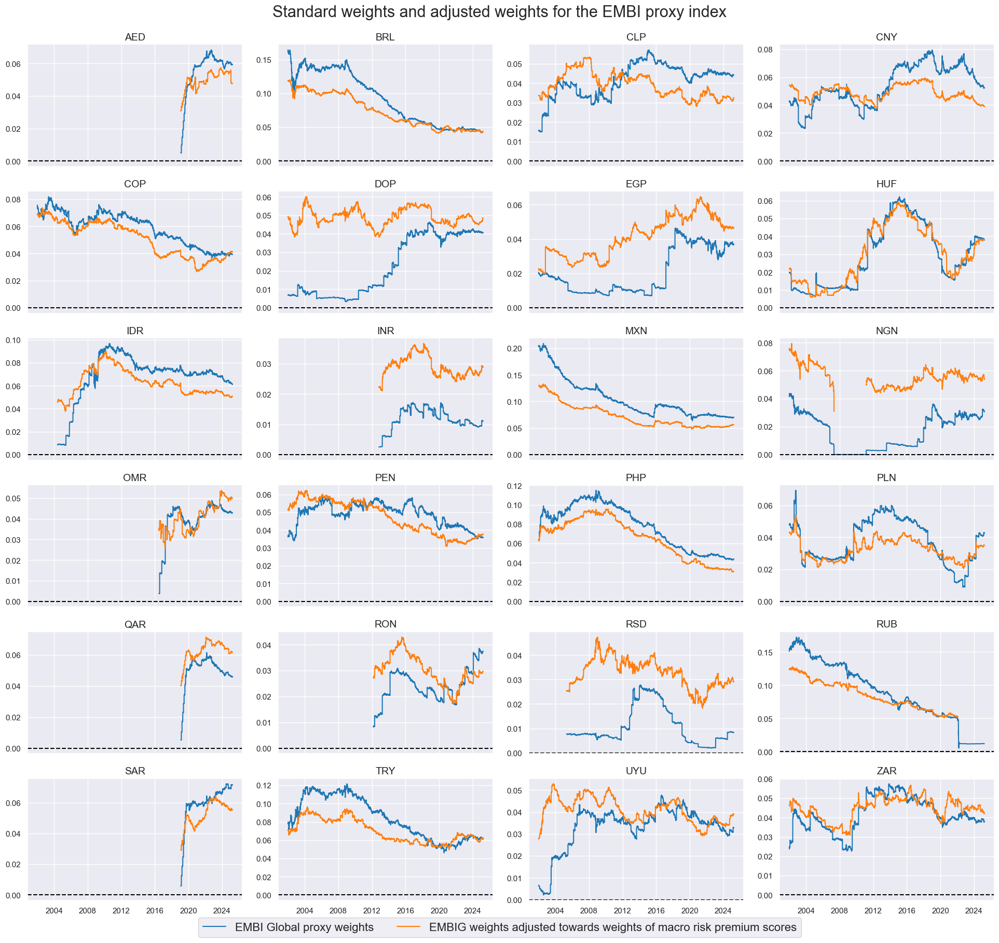

In [68]:
# View timelines of weights

xcatx = ["EMBIWGT", "EMBIWGT_ADJ"]
cidx = cids_fc
sdate = "2002-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start=sdate,
    same_y=False,
    xcat_labels=dict_labels,
    title="Standard weights and adjusted weights for the EMBI proxy index",
    title_fontsize=22,
    legend_fontsize=16,
    height=2,
)

#### Evaluation

In [69]:
dict_adj = {
    "sigs": ["EMBIWGT_ADJ", "EMBIWGT"],
    "targ": "FCBIR_NSA",
    "cidx": cids_fc,
    "start": "2002-01-01",
    "black": black_fc,
    "srr": None,
    "pnls": None,
}

In [70]:
dix = dict_adj

sigs = dix["sigs"]
ret = dix["targ"]
cidx = dix["cidx"]
start = dix["start"]
black = dix["black"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=black,
    bms=bms,
)
for sig in sigs:
    pnls.make_pnl(
        sig=sig,
        sig_op="raw",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=None,
    )

dix["pnls"] = pnls

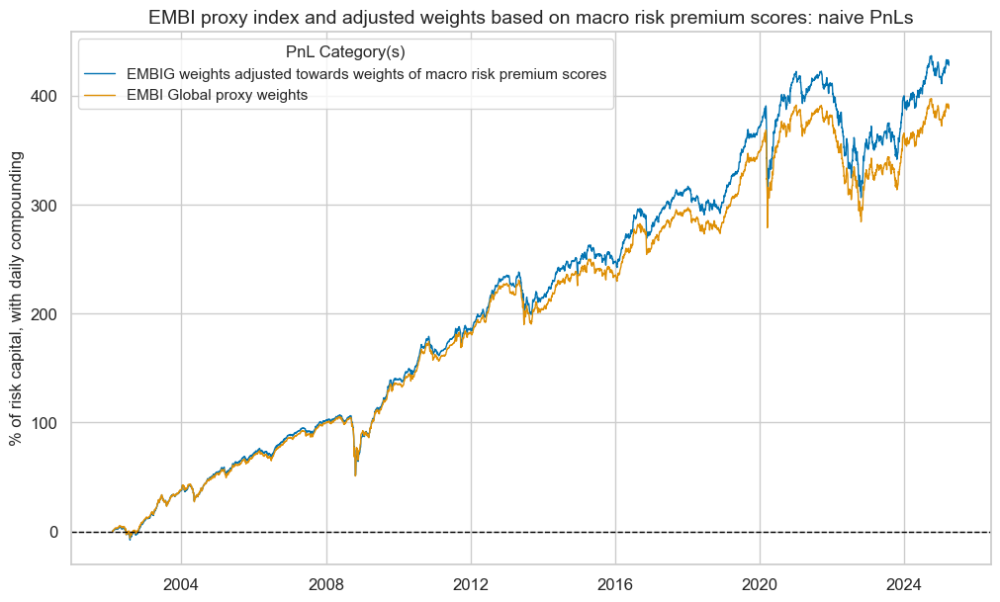

xcat,PNL_EMBIWGT_ADJ,PNL_EMBIWGT
Return %,7.380201,7.050288
St. Dev. %,6.130066,6.269362
Sharpe Ratio,1.203935,1.124562
Sortino Ratio,1.650475,1.550268
Max 21-Day Draw %,-26.669767,-25.999432
Max 6-Month Draw %,-30.385632,-29.848671
Peak to Trough Draw %,-30.790447,-30.147379
Top 5% Monthly PnL Share,0.441507,0.452107
USD_EQXR_NSA correl,0.297108,0.298464
UHY_CRXR_NSA correl,0.370191,0.3759


In [71]:
dix = dict_adj
pnls = dix["pnls"]
sigs = dix["sigs"]
pnl_cats=["PNL_" + sig for sig in sigs]

pnls.plot_pnls(
    title="EMBI proxy index and adjusted weights based on macro risk premium scores: naive PnLs",
    pnl_cats=pnl_cats,
    xcat_labels=[dict_labels[k] for k in sigs],
    title_fontsize=14,
    compounding=True,
)
pnls.evaluate_pnls(pnl_cats=pnl_cats)

### Annex

We check that the Naive PnL function generates a performance, given the EMBI weights, similar to that of the actual index. In order to do so, we compute the index performance by extracting from DQ the index levels, calculating returns, calculating the correlation and plotting.

In [72]:
df_idx = dfx[dfx["xcat"] == "EMBI_IDX"].copy()
df_idx = df_idx.sort_values("real_date")  
df_idx["value"] = df_idx["value"].pct_change() * 100
df_idx["xcat"] = "EMBI_RET_PURE"
df_idx["cid"] = "ALL"
df_idx = df_idx.dropna(subset=["value"])
df_idx = df_idx[["real_date", "xcat", "cid", "value"]]

dfx = msm.update_df(dfx, df_idx)

In [73]:
# We take the returns coming from the Naive PnL function
naive_pnldf = pnls.df[pnls.df['xcat'] == 'PNL_EMBIWGT'].copy()
naive_pnldf_all = naive_pnldf[naive_pnldf['cid'] == 'ALL'] 
naive_pnldf_all["xcat"] = "EMBIPNLRET" 
ret_df = naive_pnldf_all.copy()
embi_pure_df = dfx[dfx['xcat'] == 'EMBI_RET_PURE']
ret_df = msm.update_df(ret_df, embi_pure_df)

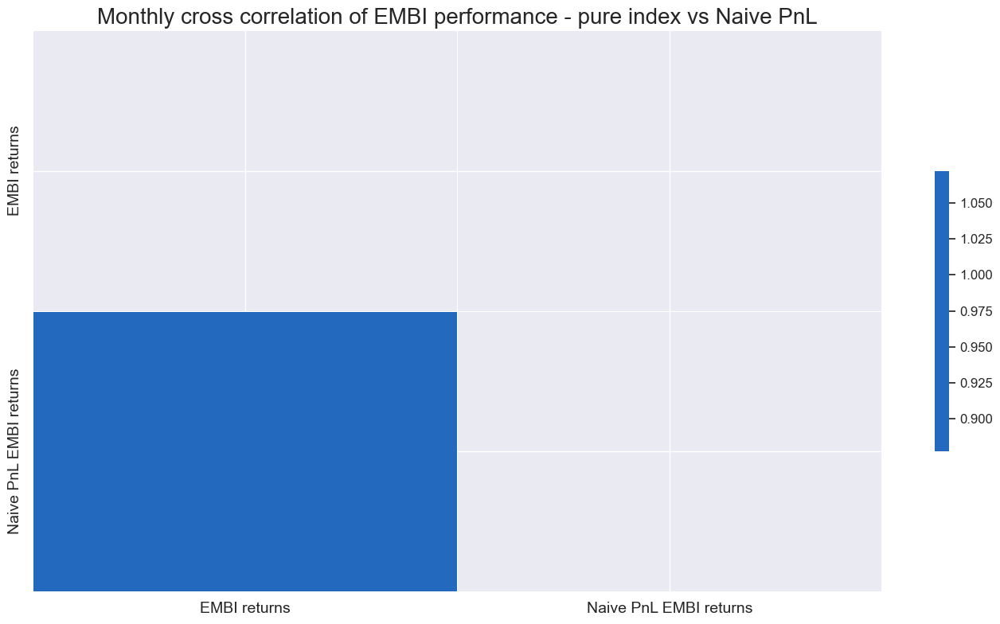

In [78]:
msp.correl_matrix(
    ret_df,
    xcats=['EMBIPNLRET', 'EMBI_RET_PURE'],
    cids=['ALL'],
    freq="M",
    cluster=False,
    title="Monthly cross correlation of EMBI performance - pure index vs Naive PnL",
    size=(14, 8),
    xcat_labels=['EMBI returns','Naive PnL EMBI returns']
)

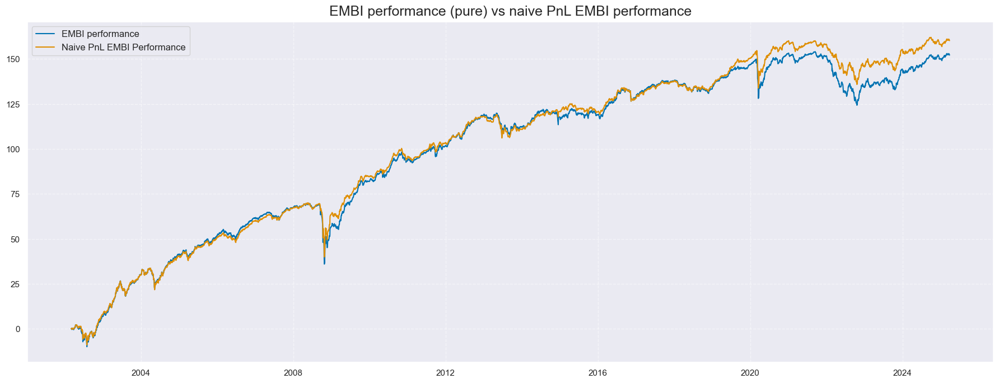

In [79]:
xcatx = ['EMBI_RET_PURE', 'EMBIPNLRET']

msp.view_timelines(
    ret_df,
    xcats=xcatx,
    cids=['ALL'],
    start="2002-03-01",
    title='EMBI performance (pure) vs naive PnL EMBI performance',
    size=(18, 7),
    cumsum=True,
    xcat_labels=['EMBI performance', 'Naive PnL EMBI Performance'],
)